In [18]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn.svm import OneClassSVM
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, mean_squared_error
from sklearn.decomposition import PCA, TruncatedSVD, FastICA
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPRegressor
from sklearn.exceptions import ConvergenceWarning, DataConversionWarning
import itertools
import pickle
import logging
import warnings

In [2]:
df = pd.read_csv("../data/run-over-dataset.csv")
print(df.shape)

columns_to_drop = ['VERBALE', 'DATA', 'Tot Testa', 'Tot Torace', 'Tot Addome', 'Tot Scheletro',
                    'Totale', 'Tot Volta cranica', 'Tot Base cranica', 
                    'Tot Neuroc.', 'Tot Splancnoc.', 'Tot Testa',
                    'Tot Tratto toracico', 'Tot Tratto lombare', 'Tot Rachide',
                    ' Totale coste', 'Sterno in toto', 'Tot Bacino', 'I costa dx', 'II costa dx',
                    'III costa dx', 'IV costa dx', 'V costa dx', 'VI costa dx', 'VII costa dx', 
                    'VIII costa dx', 'IX costa dx', 'X costa dx', 'XI costa dx', 'XII costa dx',
                    'I costa sx', 'II costa sx', 'III costa sx', 'IV costa sx', 'V costa sx', 
                    'VI costa sx', 'VII costa sx', 'VIII costa sx', 'IX costa sx', 
                    'X costa sx', 'XI costa sx', 'XII costa sx']

X = df.drop(columns=columns_to_drop)
print(X.shape)

X['ALTEZZA'] = [int(float(h.replace(',', '.'))*100) for h in X['ALTEZZA']]
X['PESO'] = [int(float(str(h).replace(',', '.'))) for h in X['PESO']]
X['BMI'] = [float(str(h).replace(',', '.')) for h in X['BMI']]

num_unique_values = X.nunique()
constant_columns = num_unique_values[num_unique_values == 1].index.tolist()

X = X.drop(columns=constant_columns)
X = X.T.drop_duplicates().T
print(X.shape)

(130, 367)
(130, 326)
(130, 274)


In [3]:
random_seed = 3355825

In [44]:
def plot_mse_neural(X, layer_sizes, n_iter):
    X_pos = X[X['Mezzo'] == 0].drop(columns=['Mezzo']).values
    X_neg = X[X['Mezzo'] == 1].drop(columns=['Mezzo']).values

    fig, axs = plt.subplots(4, 2, figsize=(20, 15))

    for idx, (layer_size) in enumerate(layer_sizes):
        hidden_layer_sizes = (layer_size,) 
        mse_values = []
        
        for n_max_iter in range(1, n_iter+1):
            with warnings.catch_warnings():
                warnings.filterwarnings("ignore", category=ConvergenceWarning)
                scaler = StandardScaler()
                X_pos = scaler.fit_transform(X_pos)
                
                mlp = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, max_iter=n_max_iter, random_state=random_seed, solver='sgd', warm_start=True)
                mlp.fit(X_pos, X_pos)

                X_pred = mlp.predict(X_pos)

                X_pos = scaler.inverse_transform(X_pos)
                X_pred = scaler.inverse_transform(X_pred)

                mse = mean_squared_error(X_pos, X_pred)
                mse_values.append(mse)

        axs[int(idx / 2), idx % 2].plot(range(1, n_iter+1), mse_values, marker='o')
        axs[int(idx / 2), idx % 2].set_title('MSE vs. Number of Iterations (' + str(layer_size) + ' size)')
        axs[int(idx / 2), idx % 2].set_xlabel('Number of Iterations')
        axs[int(idx / 2), idx % 2].set_ylabel('Mean Squared Error')

    plt.tight_layout()     
    plt.show()

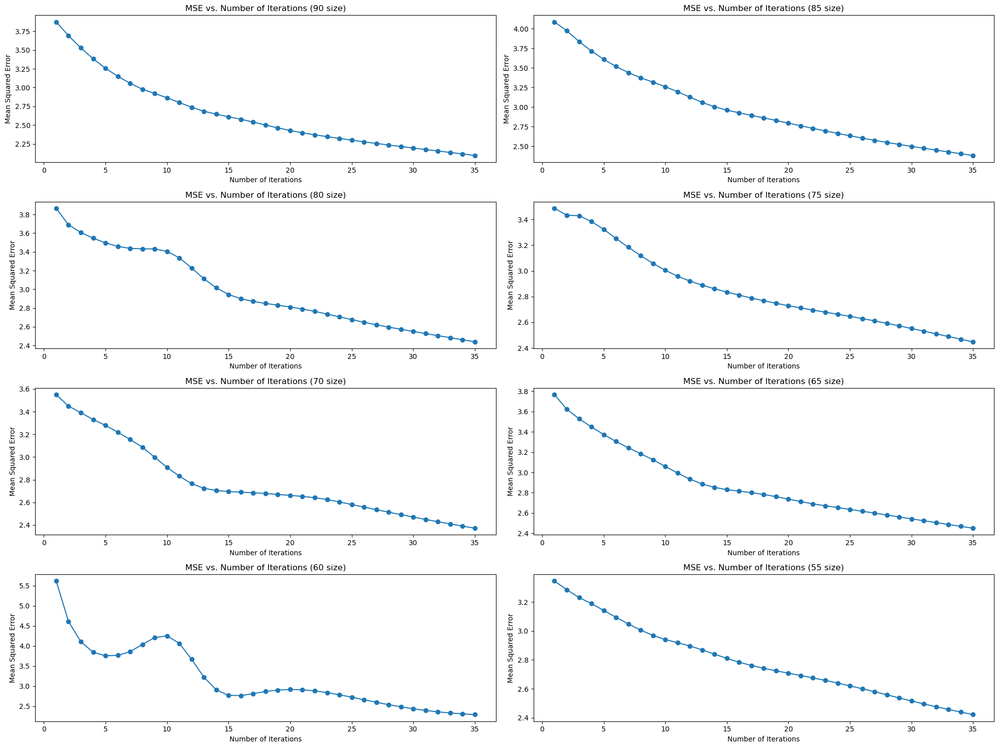

In [47]:
plot_mse_neural(X, np.arange(90, 54, -5), n_iter=35)

In [48]:
X_pos = X[X['Mezzo'] == 0].drop(columns=['Mezzo']).values
X_pos

array([[ 0., 81., 84., ...,  0.,  0.,  0.],
       [ 1., 76., 58., ...,  0.,  0.,  0.],
       [ 0., 30., 79., ...,  0.,  0.,  0.],
       ...,
       [ 1., 70., 75., ...,  0.,  0.,  0.],
       [ 0., 54., 89., ...,  0.,  0.,  0.],
       [ 1., 86., 50., ...,  0.,  0.,  0.]])

In [20]:
def find_mses(X_pos):
    all_mses = {}
    for n, (x) in enumerate(X_pos):
        mses = {}
        x_pred = {}

        for layer_size in range(3, 80, 1):
            with warnings.catch_warnings(record=True) as w:
                warnings.simplefilter("always", DataConversionWarning)
                mlp = MLPRegressor(hidden_layer_sizes=layer_size, max_iter=480, random_state=random_seed, solver='sgd')
                
                x = x.reshape(-1, 1)
                mlp.fit(x, x)

                x_pred[layer_size] = mlp.predict(x)
                mses[layer_size] = mean_squared_error(x, x_pred[layer_size])

        best_layers_size = min(mses, key=mses.get)
        all_mses[n] = (best_layers_size, mses[best_layers_size], x_pred[best_layers_size])

    return all_mses

mses = find_mses(X_pos) 
mses   


{0: (66,
  6.398297190158955e-05,
  array([2.47390512e-03, 8.10209696e+01, 8.40193703e+01, 1.74970859e+02,
         2.74780996e+01, 1.01563414e+00, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 1.01563414e+00, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 3.04026653e+00,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 3.04026653e+00, 2.47390512e-03, 3.04026653e+00,
         3.04026653e+00, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         1.01563414e+00, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 1.01563414e+00,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.47390512e-03, 2.47390512e-03, 2.47390512e-03, 2.47390512e-03,
         2.473905

In [34]:
pred_list = [val[2] for val in mses.values()]
syndata = np.vstack(pred_list)

for i, (curr_X) in enumerate(syndata):
    for j, (x) in enumerate(curr_X):
        if j != 4:
            syndata[i][j] = round(x)

mean_squared_error(X_pos, syndata)    

3.943609574928002e-06

In [64]:
scaler = StandardScaler()
X_pos = scaler.fit_transform(X_pos)
                
mlp = MLPRegressor(hidden_layer_sizes=90, max_iter=45, random_state=random_seed, solver='sgd', warm_start=True)
mlp.fit(X_pos, X_pos)

X_pred = mlp.predict(X_pos)

X_pos = scaler.inverse_transform(X_pos)
X_pred = scaler.inverse_transform(X_pred)
X_pred

/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (45) reached and the optimization hasn't converged yet.
  warnings.warn(


array([[ 3.59676734e-01,  6.64042976e+01,  7.72192468e+01, ...,
         2.34047734e-02,  1.01671569e-01,  4.71889456e-02],
       [ 4.50136791e-01,  4.95966359e+01,  4.92718518e+01, ...,
         7.75862181e-02, -7.86284579e-03,  1.07881590e-01],
       [ 2.94798267e-01,  4.85360020e+01,  7.38273408e+01, ...,
        -9.78038088e-05,  2.80892473e-01,  7.14637255e-02],
       ...,
       [ 2.88430063e-01,  6.05315909e+01,  7.54352963e+01, ...,
        -1.53844945e-04, -1.98565194e-02,  1.66585884e-02],
       [ 3.02798109e-01,  6.75968954e+01,  9.61153318e+01, ...,
        -7.84073562e-02, -2.47510588e-01, -5.25549122e-02],
       [ 6.14286923e-01,  7.20534095e+01,  6.07323317e+01, ...,
        -5.15446021e-03,  2.25697711e-01,  1.09451279e-01]])

In [68]:
for i, (curr_X) in enumerate(X_pred):
    for j, (x) in enumerate(curr_X):
        if j != 4:
            X_pred[i][j] = int(round(x))
            if X_pred[i][j] < 0:
                X_pred[i][j] = 0
        else:
            X_pred[i][j] = float(x)

mean_squared_error(X_pos, X_pred)    

1.909239245216977

In [69]:
for n, (x) in enumerate(X_pos):
    print(x, X_pred[n])

[ 0.00000000e+00  8.10000000e+01  8.40000000e+01  1.75000000e+02
  2.74285714e+01  1.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  1.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  3.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  3.00000000e+00  0.00000000e+00  3.00000000e+00
  3.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000

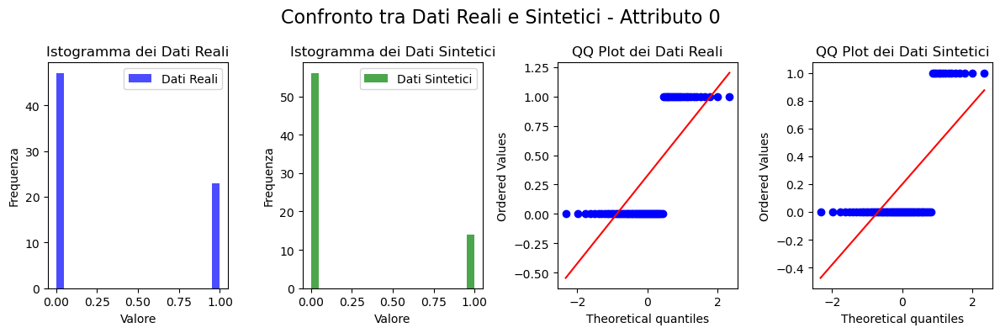

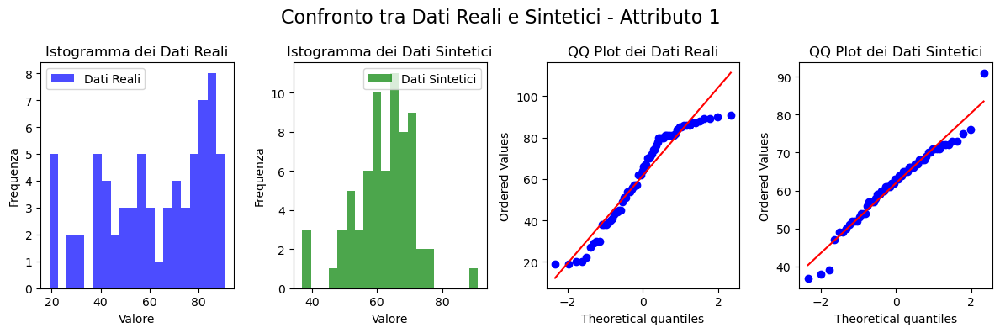

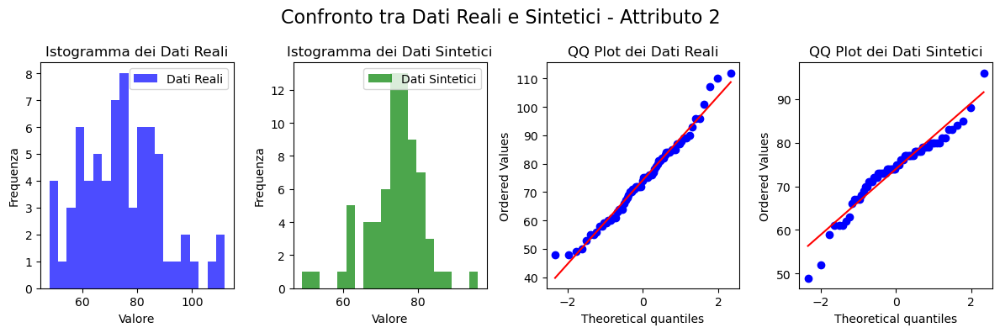

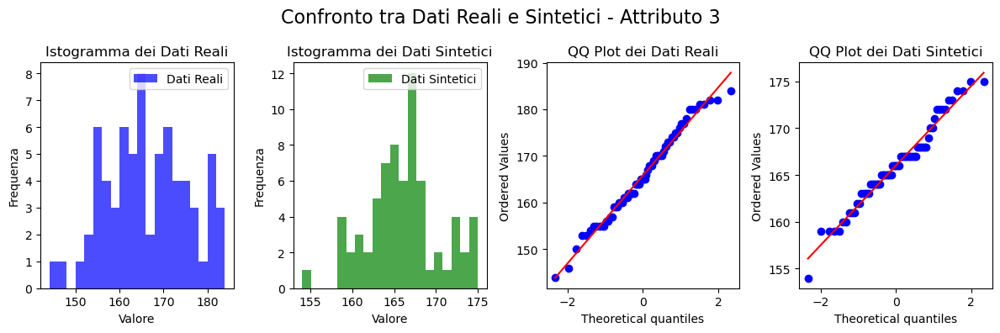

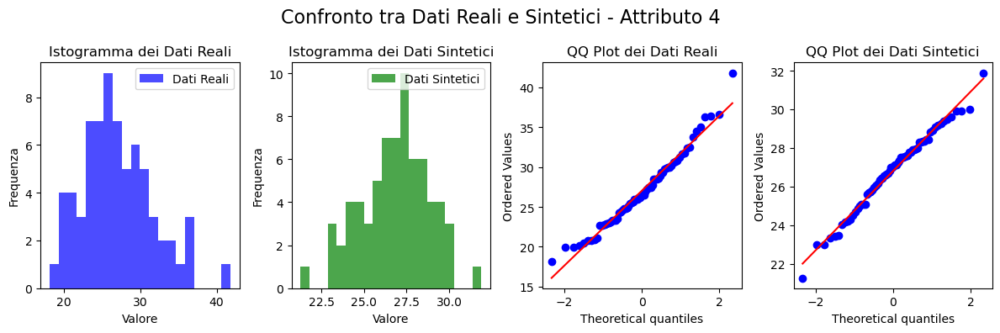

...

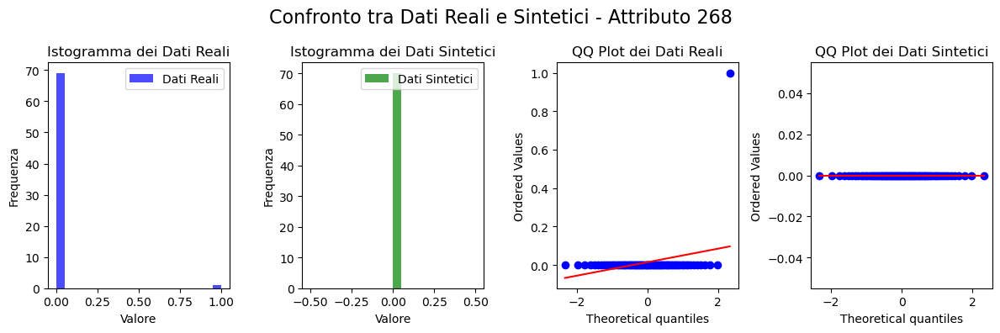

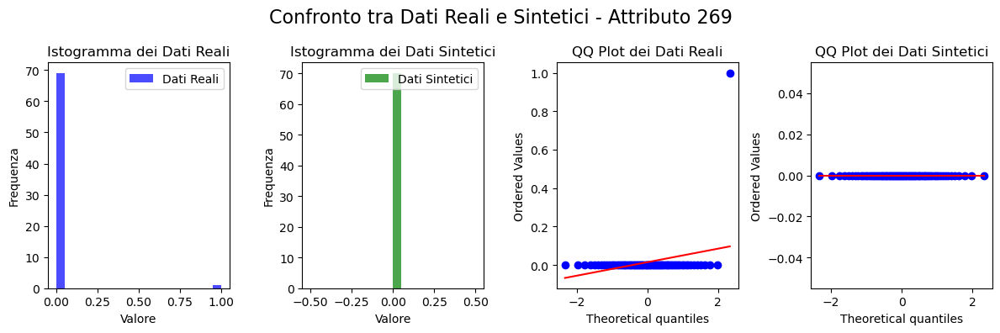

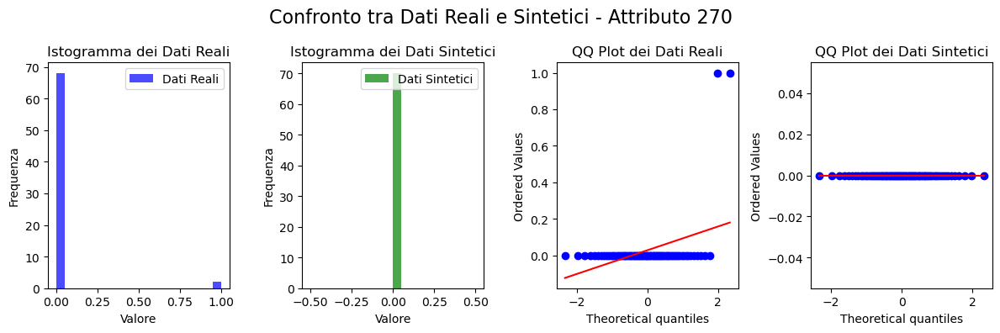

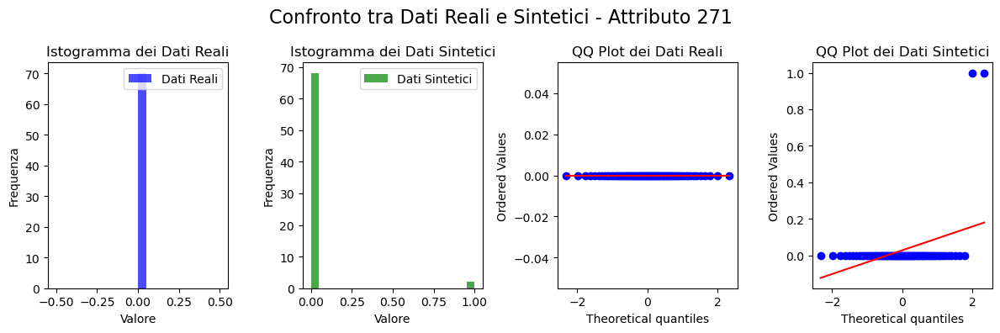

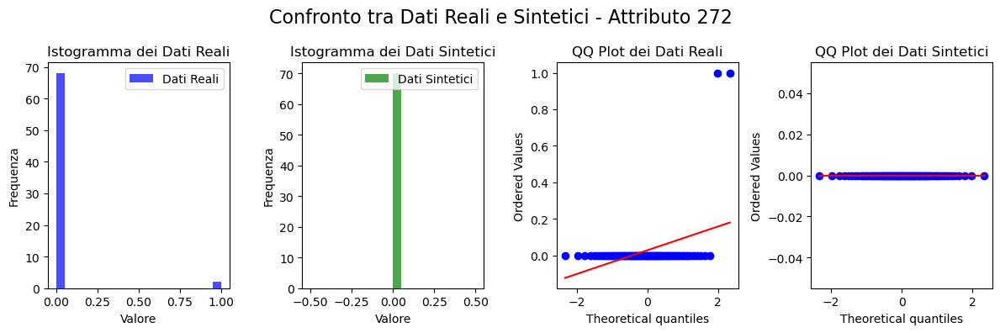

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import probplot

for i, (_) in enumerate(X_pos[0]):
    real_data = X_pos[:, i]
    synthetic_data = X_pred[:, i]

    fig, axs = plt.subplots(1, 4, figsize=(12, 4))
    fig.suptitle(f'Confronto tra Dati Reali e Sintetici - Attributo {i}', fontsize=16)

    axs[0].hist(real_data, bins=20, color='blue', alpha=0.7, label='Dati Reali')
    axs[0].set_title('Istogramma dei Dati Reali')
    axs[0].set_xlabel('Valore')
    axs[0].set_ylabel('Frequenza')
    axs[0].legend()

    axs[1].hist(synthetic_data, bins=20, color='green', alpha=0.7, label='Dati Sintetici')
    axs[1].set_title('Istogramma dei Dati Sintetici')
    axs[1].set_xlabel('Valore')
    axs[1].set_ylabel('Frequenza')
    axs[1].legend()

    probplot(real_data, dist="norm", plot=axs[2])
    axs[2].set_title('QQ Plot dei Dati Reali')

    probplot(synthetic_data, dist="norm", plot=axs[3])
    axs[3].set_title('QQ Plot dei Dati Sintetici')

    plt.tight_layout()
    plt.show()
